# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


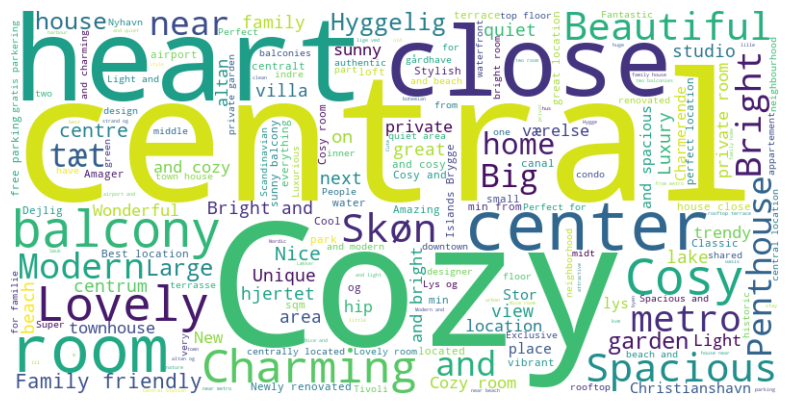

In [236]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

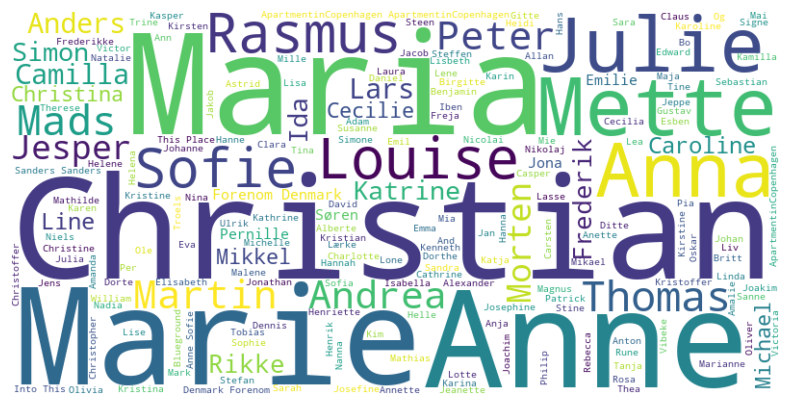

In [237]:
import pandas as pd
import sklearn as sk

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Convert the 'name' column to a single string
text = ' '.join(data['host_name'].astype(str))

# Remove columns where 'host_name' is 'None'
data_filtered = data_filtered.loc[data['host_name'] != 'None']

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [238]:
# State your solution here. Add more cells if needed.
import folium as f

data_limited = data[["latitude",  "longitude"]]
# Create a map centered around a specific location (latitude, longitude)
m = f.Map(location=[55.676098,     12.568337], zoom_start=11) # Copenhagen

for counter, listing in data_limited.iterrows():
    circle_size = 1
    f.CircleMarker(
        location=[listing['latitude'], listing['longitude']],
        radius=circle_size,
        color="crimson",
        fill=True,
        fill_color="crimson",
    ).add_to(m)

m

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

C:\Users\popca\AppData\Local\Temp\ipykernel_3768\424742923.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_filtered, x='neighbourhood_cleansed', y='price', palette='viridis')


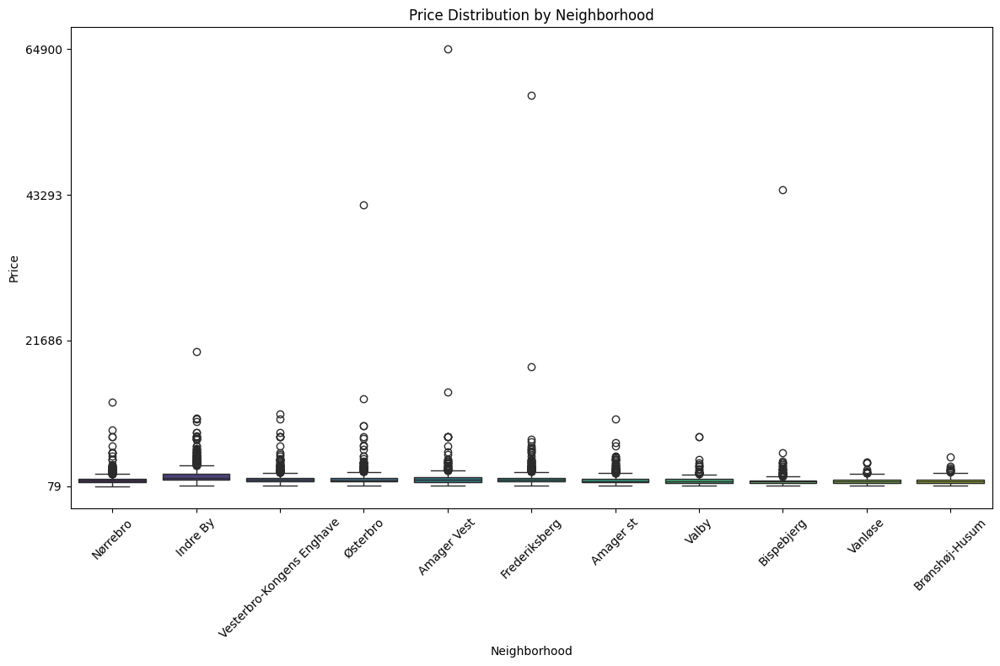

In [239]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Ensure the 'price' column is numeric and remove any rows with non-numeric prices
data_filtered['price'] = pd.to_numeric(data_filtered['price'], errors='coerce')

# Drop rows with NaN values in 'price' (if any were introduced by the coercion step)
data_filtered = data_filtered.dropna(subset=['price'])

plt.figure(figsize=(12, 8))

# Create the box plot
sns.boxplot(data=data_filtered, x='neighbourhood_cleansed', y='price', palette='viridis')

# Add labels and title
plt.xlabel('Neighborhood')
plt.ylabel('Price')
plt.title('Price Distribution by Neighborhood')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Set y-ticks to show 4 price values (min, max, and two evenly spaced values)
price_min = data_filtered['price'].min()
price_max = data_filtered['price'].max()
price_ticks = np.linspace(price_min, price_max, 4)  # 4 evenly spaced values between min and max

plt.yticks(price_ticks)  # Keep float values for price ticks

# Show the plot
plt.tight_layout()
plt.show()

C:\Users\popca\AppData\Local\Temp\ipykernel_3768\2757019637.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_filtered, x='neighbourhood_cleansed', y='price_winsorized', palette='viridis')


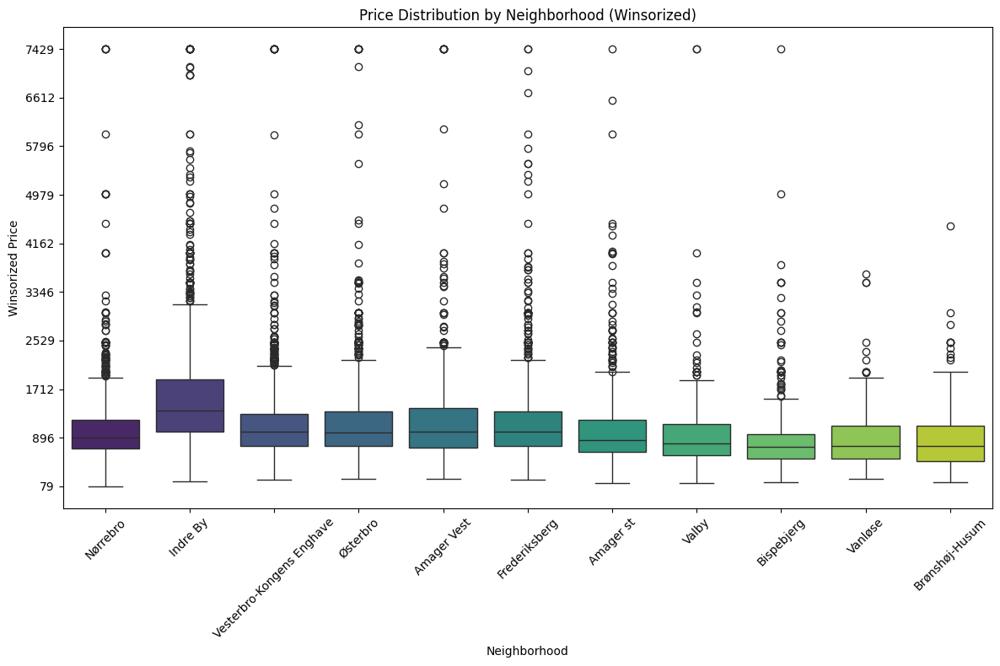

In [240]:
# The Above Version is populated with massive outliers in data that skews the data visualization.
# Below is a version that cuts out these outliers to better show the data with the top 0.25% of outliers removed.

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import mstats

# Ensure the 'price' column is numeric and remove any rows with non-numeric prices
data_filtered['price'] = pd.to_numeric(data_filtered['price'], errors='coerce')
data_filtered = data_filtered.dropna(subset=['price'])

# Apply Winsorization to cap the top 0.25% of prices
data_filtered['price_winsorized'] = mstats.winsorize(data_filtered['price'], limits=[0, 0.002])

plt.figure(figsize=(12, 8))

# Create the box plot with winsorized prices
sns.boxplot(data=data_filtered, x='neighbourhood_cleansed', y='price_winsorized', palette='viridis')

# Add labels and title
plt.xlabel('Neighborhood')
plt.ylabel('Winsorized Price')
plt.title('Price Distribution by Neighborhood (Winsorized)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Set y-ticks to show a range of values
price_min = data_filtered['price_winsorized'].min()
price_max = data_filtered['price_winsorized'].max()
price_ticks = np.linspace(price_min, price_max, 10)  # 10 evenly spaced values between min and max

plt.yticks(price_ticks)  # Show the range of winsorized prices

# Show the plot
plt.tight_layout()
plt.show()

### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

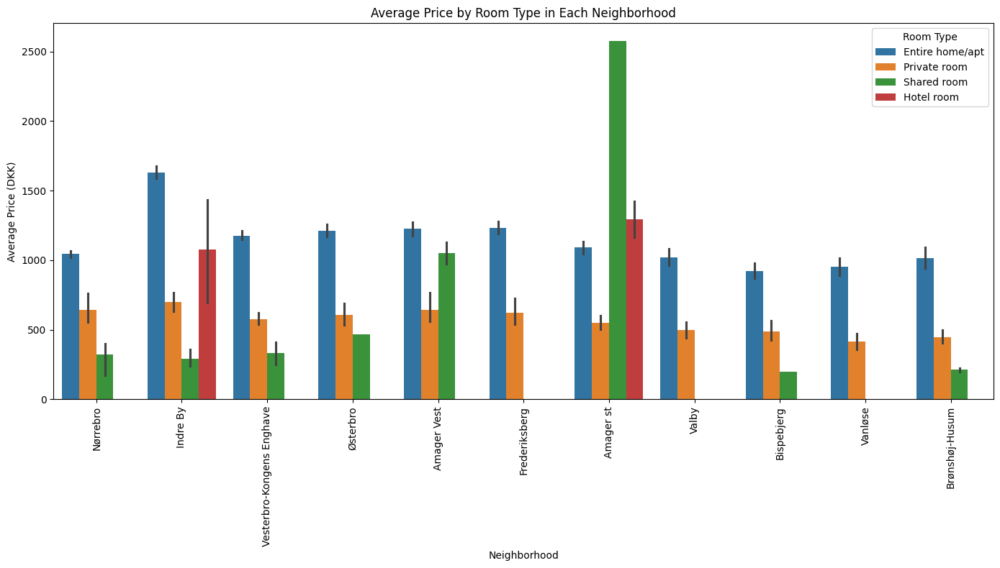

In [241]:
# State your solution here. Add more cells if needed.
# Grouping the data by neigborhood and room type
# Using .agg to calculate the mean, median, mode, minimun, maximum, standart deviation, variance and quartiles for price and availability
grouped_data= data_filtered.groupby(['neighbourhood_cleansed', 'room_type']).agg(
    mean_price=('price', 'mean'),
    median_price=('price', 'median'),
    mode_price=('price', lambda x: x.mode()[0] if not x.mode().empty else None),
    min_price=('price', 'min'),
    max_price=('price', 'max'),
    std_dev_price=('price', 'std'),
    variance_price=('price', 'var'),
    count=('price', 'count'),
    first_quartile_price=('price', lambda x: x.quantile(0.25)),     # Quantile = values that split sorted data or a probability distribution into equal areas
    third_quartile_price=('price', lambda x: x.quantile(0.75)),
    mean_availability=('availability_365', 'mean'),
    median_availability=('availability_365', 'median'),
    mode_availability=('availability_365', lambda x: x.mode()[0] if not x.mode().empty else None),
    std_dev_availability=('availability_365', 'std'),
    variance_availability=('availability_365', 'var')
    ).reset_index()

import seaborn as sns 

plt.figure(figsize=(14, 8))
sns.barplot(data=data_filtered, x='neighbourhood_cleansed', y='price', hue='room_type')
plt.xticks(rotation=90)
plt.title('Average Price by Room Type in Each Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Average Price (DKK)')
plt.legend(title='Room Type')
plt.tight_layout()
plt.show()

### 5. Based on self-chosen features, develop three different regression models that can predict the price of a rental property. Remember to divide your data into training data and test data. Comment on your findings.

In [242]:

# imports for data handling
import pandas as pd

#lasso
from sklearn.linear_model import Lasso
from sklearn.feature_selection import RFE


data = pd.read_csv('listings.csv')

data_limited = data[["id", "name", "host_id", "host_name", 
                     "neighbourhood_cleansed", "latitude", "longitude", 
                     "room_type", "price", "minimum_nights", 
                     "number_of_reviews", "last_review", "review_scores_rating", 
                     "review_scores_accuracy", "review_scores_cleanliness", 
                     "review_scores_checkin", "review_scores_communication", 
                     "review_scores_location", "review_scores_value", 
                     "reviews_per_month", "calculated_host_listings_count", 
                     "availability_365"]]


# Removing rows with no reviews
data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# Remove NaN values
data_filtered = data_filtered.dropna()

# Correct neighborhood names
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace({
    "Nrrebro": "Nørrebro", "sterbro": "Østerbro", "Vanlse": "Vanløse", "Brnshj-Husum": "Brønshøj-Husum"})

data_filtered['price'] = data_filtered['price'].replace('[\\$,]', '', regex=True).astype(float)


# Dropping irrelevant columns 
columns_to_remove = ['id', 'host_id', 'calculated_host_listings_count']
filtered_data = data_filtered.drop(columns=columns_to_remove)

# Select the features (excluding non-numeric and target variables)
X = data_filtered.drop(columns=['price', 'name', 'host_name', 'neighbourhood_cleansed', 'last_review', 'room_type'])
y = data_filtered['price']

# Initialize Lasso model
lasso = Lasso(alpha=0.0001)

# Perform Recursive Feature Elimination (RFE)
rfe = RFE(estimator=lasso, n_features_to_select=5)  # Selecting top 5 features
rfe.fit(X, y)

# Get the ranking of features
ranking = pd.DataFrame({
    'Feature': X.columns,
    'Ranking': rfe.ranking_
}).sort_values(by='Ranking')

# Output the ranking for all features
print(ranking)

                           Feature  Ranking
3                        longitude        1
2                         latitude        1
11          review_scores_location        1
8        review_scores_cleanliness        1
12             review_scores_value        1
10     review_scores_communication        2
6             review_scores_rating        3
7           review_scores_accuracy        4
9            review_scores_checkin        5
13               reviews_per_month        6
4                   minimum_nights        7
14  calculated_host_listings_count        8
15                availability_365        9
5                number_of_reviews       10
1                          host_id       11
0                               id       12


In [243]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Load the data
data = pd.read_csv('listings.csv')

# Filter relevant columns
data_limited = data[[ 
    "id", "name", "host_id", "host_name", "neighbourhood_cleansed",
    "latitude", "longitude", "room_type", "price", "minimum_nights",
    "number_of_reviews", "last_review", "review_scores_rating",
    "review_scores_accuracy", "review_scores_cleanliness",
    "review_scores_checkin", "review_scores_communication",
    "review_scores_location", "review_scores_value", "reviews_per_month",
    "calculated_host_listings_count", "availability_365"
]]

# Removing rows with no reviews
data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]
# Remove NaN values
data_filtered = data_filtered.dropna()

# Correct neighborhood names
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace({
    "Nrrebro": "Nørrebro", "sterbro": "Østerbro", "Vanlse": "Vanløse", "Brnshj-Husum": "Brønshøj-Husum"})

# Remove dollar signs and commas and convert to float
data_filtered['price'] = data_filtered['price'].replace('[\\$,]', '', regex=True).astype(float)

# Defining features and target
features = [
    'latitude', 'longitude', 'review_scores_cleanliness',
    'review_scores_location', 'review_scores_value'
]
target = 'price'

X = data_filtered[features]
y = data_filtered[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit the scaler to the training data
X_test_scaled = scaler.transform(X_test)        # Transform the test data

# Define K-Fold Cross-Validation
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

# Hyperparameter tuning for Ridge, Lasso, and Gradient Boosting using GridSearchCV
ridge_params = {'alpha': [0.01, 0.1, 1.0, 10.0, 100.0]}
lasso_params = {'alpha': [0.001, 0.01, 0.1, 1.0]}
gboost_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [2, 3, 4]
}

# Ridge Regression with Cross-Validation
ridge = Ridge()
ridge_grid = GridSearchCV(ridge, ridge_params, cv=kfold, scoring='r2')
ridge_grid.fit(X_train_scaled, y_train)

# Lasso Regression with Cross-Validation
lasso = Lasso()
lasso_grid = GridSearchCV(lasso, lasso_params, cv=kfold, scoring='r2')
lasso_grid.fit(X_train_scaled, y_train)

# Gradient Boosting with Cross-Validation
gboost = GradientBoostingRegressor()
gboost_grid = GridSearchCV(gboost, gboost_params, cv=kfold, scoring='r2')
gboost_grid.fit(X_train_scaled, y_train)

# Best model parameters and scores from cross-validation
print("Best Ridge Model Parameters:", ridge_grid.best_params_)
print("Best Ridge R² from CV:", ridge_grid.best_score_)

print("Best Lasso Model Parameters:", lasso_grid.best_params_)
print("Best Lasso R² from CV:", lasso_grid.best_score_)

print("Best Gradient Boosting Model Parameters:", gboost_grid.best_params_)
print("Best Gradient Boosting R² from CV:", gboost_grid.best_score_)

# Evaluate the best models on the test data
ridge_best_model = ridge_grid.best_estimator_
lasso_best_model = lasso_grid.best_estimator_
gboost_best_model = gboost_grid.best_estimator_

# Predictions on the test set
ridge_test_pred = ridge_best_model.predict(X_test_scaled)
lasso_test_pred = lasso_best_model.predict(X_test_scaled)
gboost_test_pred = gboost_best_model.predict(X_test_scaled)

# Compute R² and MSE for the test set
ridge_test_r2 = r2_score(y_test, ridge_test_pred)
lasso_test_r2 = r2_score(y_test, lasso_test_pred)
gboost_test_r2 = r2_score(y_test, gboost_test_pred)

ridge_test_mse = mean_squared_error(y_test, ridge_test_pred)
lasso_test_mse = mean_squared_error(y_test, lasso_test_pred)
gboost_test_mse = mean_squared_error(y_test, gboost_test_pred)

# Print final R² and MSE results for the test set
print("\nTest Set Performance:")
print("Ridge - R²:", ridge_test_r2, "MSE:", ridge_test_mse)
print("Lasso - R²:", lasso_test_r2, "MSE:", lasso_test_mse)
print("Gradient Boosting - R²:", gboost_test_r2, "MSE:", gboost_test_mse)




Best Ridge Model Parameters: {'alpha': 0.01}
Best Ridge R² from CV: 0.01872685787017294
Best Lasso Model Parameters: {'alpha': 0.001}
Best Lasso R² from CV: 0.01872684402041942
Best Gradient Boosting Model Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200}
Best Gradient Boosting R² from CV: 0.03568125746438766

Test Set Performance:
Ridge - R²: 0.012183154007068153 MSE: 1276705.3478802023
Lasso - R²: 0.01218338339200764 MSE: 1276705.051411297
Gradient Boosting - R²: 0.03654139054435024 MSE: 1245223.5089358382


In [244]:
# User Input for Predictions
def make_prediction(model, input_data):
    # Scale the input data (ensure it's in the format expected by the model)
    input_data_scaled = scaler.transform([input_data])  # Reshape and scale the input data
    prediction = model.predict(input_data_scaled)  # Predict using the model
    return prediction[0]

# Example input data (replace these values with real inputs for predictions)
# The input format must now follow the current feature set: [latitude, longitude, review_scores_cleanliness, review_scores_location, review_scores_value]
input_data = [55.6761, 12.5683, 9.0, 9.0, 9.0]  # values for the features

# Predict using the best models
ridge_prediction = make_prediction(ridge_best_model, input_data)
lasso_prediction = make_prediction(lasso_best_model, input_data)
gboost_prediction = make_prediction(gboost_best_model, input_data)

# Print the predictions
print(f"Predicted price (Ridge): ${ridge_prediction:.2f}")
print(f"Predicted price (Lasso): ${lasso_prediction:.2f}")
print(f"Predicted price (Gradient Boosting): ${gboost_prediction:.2f}")


Predicted price (Ridge): $2151.99
Predicted price (Lasso): $2151.98
Predicted price (Gradient Boosting): $1498.13


C:\Users\popca\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\popca\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\popca\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [245]:
# Observations:
# 1: despite training multiple different variations with different data, the best model generated is only marginally better than the first iteration.
# 2: It appears the regression models do not work well on this type of dataset.
# 3: perhaps better or different features could be found that help improve the accuracy.
# 4: even with the addition of hyper parameters and cross validation, the models do not perform well at all.

# Overall it appears the current set of features do not have enough correlation for these simple models to be able to predict the target with any significant accuracy
# Although additional parameters did help, they did not contribute meaningfully to the accuracy and performance of the models.